In [334]:
# import Pkg; Pkg.add("UMAP")
# using UMAP
using MLDatasets
using Plots


using Arpack
using Distances
using LinearAlgebra
using LsqFit: curve_fit
using NearestNeighborDescent
using SparseArrays

# using PyCall

include("ssl_utils.jl")
include("embeddings.jl")
include("umap_.jl")
include("utils.jl")

fuzzy_set_intersection (generic function with 1 method)

In [335]:
N = 3000
X = reshape(MNIST.traintensor(Float64), 28*28, :)
X = X[:,1:N]
mnist_y = MNIST.trainlabels(1:size(X, 2));

  5.679528 seconds (3.23 M allocations: 440.351 MiB, 32.96% compilation time)


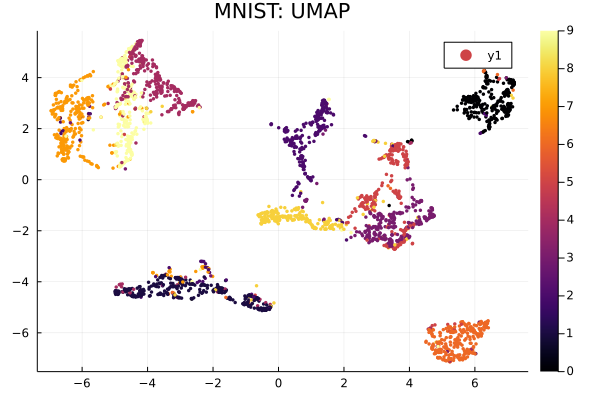

In [336]:

@time res_jl = umap(X; n_neighbors=10, min_dist=0.001, n_epochs=200)

scatter(res_jl[1,:], res_jl[2,:], zcolor=mnist_y, 
        title="MNIST: UMAP", marker=(2, 2, :auto, stroke(0)))

In [337]:
knns, dists = knn_search(X, 20, Euclidean())
umap_graph = fuzzy_simplicial_set(knns, dists, 20, size(X, 2), 1, 1)

3000×3000 SparseMatrixCSC{Float64, Int64} with 84928 stored entries:
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣷⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣽⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⡿

In [338]:

"""
    QUMAP_(X::AbstractMatrix[, n_components=2]; <kwargs>) -> UMAP_ object
Create a model representing the embedding of data `X` into `n_components`-dimensional space. 
The returned model has the following fields:
- `graph`: the graph representing the fuzzy simplicial set of the manifold of `X`.
- `embedding`: the `n-component`-dimensional embedding of the data `X`.
- `data`: a reference to the input data `X`.
- `knns`: a matrix of indices of `X` representing each point's nearest neighbors according to `metric`.
          `knns[j, i]` is the index of point i's jth nearest neighbor.
- `dists`: the respective distances of the above neighbors.
           `dists[j, i]` is the distance of point i's jth nearest neighbor.
# Keyword Arguments
- `n_neighbors::Integer = 15`: the number of neighbors to consider as locally connected. Larger values capture more global structure in the data, while small values capture more local structure.
- `metric::{SemiMetric, Symbol} = Euclidean()`: the metric to calculate distance in the input space. It is also possible to pass `metric = :precomputed` to treat `X` like a precomputed distance matrix.
- `n_epochs::Integer = 300`: the number of training epochs for embedding optimization
- `learning_rate::Real = 1`: the initial learning rate during optimization
- `init::Symbol = :spectral`: how to initialize the output embedding; valid options are `:spectral` and `:random`
- `min_dist::Real = 0.1`: the minimum spacing of points in the output embedding
- `spread::Real = 1`: the effective scale of embedded points. Determines how clustered embedded points are in combination with `min_dist`.
- `set_operation_ratio::Real = 1`: interpolates between fuzzy set union and fuzzy set intersection when constructing the UMAP graph (global fuzzy simplicial set). The value of this parameter should be between 1.0 and 0.0: 1.0 indicates pure fuzzy union, while 0.0 indicates pure fuzzy intersection.
- `local_connectivity::Integer = 1`: the number of nearest neighbors that should be assumed to be locally connected. The higher this value, the more connected the manifold becomes. This should not be set higher than the intrinsic dimension of the manifold.
- `repulsion_strength::Real = 1`: the weighting of negative samples during the optimization process.
- `neg_sample_rate::Integer = 5`: the number of negative samples to select for each positive sample. Higher values will increase computational cost but result in slightly more accuracy.
- `a = nothing`: this controls the embedding. By default, this is determined automatically by `min_dist` and `spread`.
- `b = nothing`: this controls the embedding. By default, this is determined automatically by `min_dist` and `spread`.
"""
function QUMAP_(X::AbstractMatrix{S},
               n_components::Integer = 2;
               n_neighbors::Integer = 15,
               ε::Real = 1.0,
               metric::Union{SemiMetric, Symbol} = Euclidean(),
               n_epochs::Integer = 300,
               learning_rate::Real = 1,
               init::Symbol = :spectral,
               min_dist::Real = 1//10,
               spread::Real = 1,
               set_operation_ratio::Real = 1,
               local_connectivity::Integer = 1,
               repulsion_strength::Real = 1,
               neg_sample_rate::Integer = 5,
               a::Union{Real, Nothing} = nothing,
               b::Union{Real, Nothing} = nothing
               ) where {S<:Real}
    # argument checking
    size(X, 2) > n_neighbors > 0|| throw(ArgumentError("size(X, 2) must be greater than n_neighbors and n_neighbors must be greater than 0"))
    size(X, 1) > n_components > 1 || throw(ArgumentError("size(X, 1) must be greater than n_components and n_components must be greater than 1"))
    n_epochs > 0 || throw(ArgumentError("n_epochs must be greater than 0"))
    learning_rate > 0 || throw(ArgumentError("learning_rate must be greater than 0"))
    min_dist > 0 || throw(ArgumentError("min_dist must be greater than 0"))
    0 ≤ set_operation_ratio ≤ 1 || throw(ArgumentError("set_operation_ratio must lie in [0, 1]"))
    local_connectivity > 0 || throw(ArgumentError("local_connectivity must be greater than 0"))


    # main algorithm
    knns, dists = knn_search(X, n_neighbors, metric)
#     graph = fuzzy_simplicial_set(knns, dists, n_neighbors, size(X, 2), local_connectivity, set_operation_ratio)
    graph = QOT_weight(X', ε, maxiter=30)
    
    embedding = initialize_embedding(graph, n_components, Val(init))

    embedding = optimize_embedding(graph, embedding, embedding, n_epochs, learning_rate, min_dist, spread, repulsion_strength, neg_sample_rate, move_ref=true)
    # TODO: if target variable y is passed, then construct target graph
    #       in the same manner and do a fuzzy simpl set intersection

    return UMAP_(graph, hcat(embedding...), X, knns, dists)
end

QUMAP_

  3.813862 seconds (210.14 k allocations: 266.993 MiB)


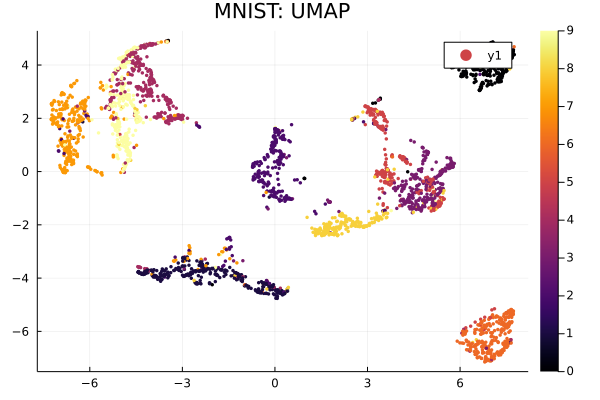

In [339]:

@time res_jl = umap(X; n_neighbors=10, min_dist=0.001, n_epochs=200)

scatter(res_jl[1,:], res_jl[2,:], zcolor=mnist_y, 
        title="MNIST: UMAP", marker=(2, 2, :auto, stroke(0)))

 26.422765 seconds (1.49 M allocations: 45.440 GiB, 5.99% gc time, 3.10% compilation time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 3.340705490018081e-11, err2 = 3.340749898939066e-11 
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/Cj9SU/src/OptimalTransport.jl:625


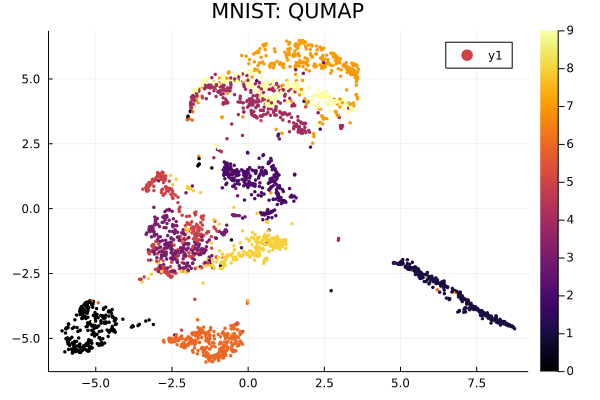

In [340]:
C = pairwise(SqEuclidean(), X', X')

@time qumap = QUMAP_(X, ε = 0.25*mean(C), min_dist=0.001, n_epochs=200)

q_emb = qumap.embedding
# println(qumap.graph)

scatter(q_emb[1,:], q_emb[2,:], zcolor=mnist_y, 
        title="MNIST: QUMAP", marker=(2, 2, :auto, stroke(0)))

In [341]:
mean(C)

560.0440891616261

 26.227279 seconds (65.61 k allocations: 45.351 GiB, 5.36% gc time, 0.05% compilation time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 3.340705490018081e-11, err2 = 3.340749898939066e-11 
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/Cj9SU/src/OptimalTransport.jl:625


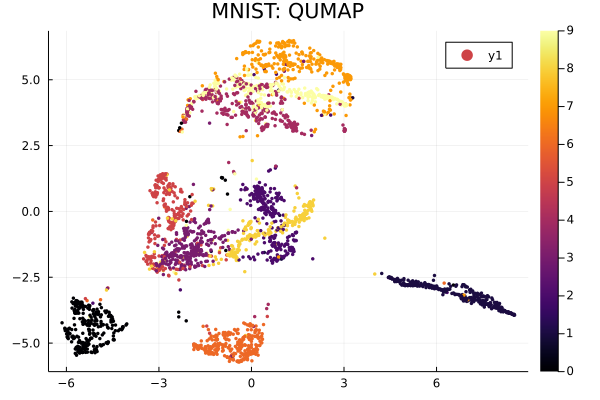

In [342]:
@time qumap = QUMAP_(X, ε = 0.25*mean(C), n_neighbors = 8, min_dist=0.001, n_epochs=200)

q_emb = qumap.embedding
# println(qumap.graph)

scatter(q_emb[1,:], q_emb[2,:], zcolor=mnist_y, 
        title="MNIST: QUMAP", marker=(2, 2, :auto, stroke(0)))

In [343]:
qumap.graph

3000×3000 SparseMatrixCSC{Float64, Int64} with 70800 stored entries:
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿
⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⣿⡿

In [344]:
function SwissRoll(N)
    
    T = rand(N)
    t = (3 * pi / 2) * (1 .+ 2 * T)
    # t = 2* (1 .+ 2 * rand(N)).^2
    h = 30 * rand(N)
    coords = [t .* cos.(t) h t .* sin.(t)] 
    # + noise * randn(N, 3)
    
    arc = @. 0.5 * (t*sqrt(t^2 +1) + asinh(t))
    
    geodesic = @. sqrt( (arc- arc')^2 + (h-h')^2) 

    params = hcat(T, h./30)
    
   return coords, geodesic, params
end



SwissRoll (generic function with 1 method)

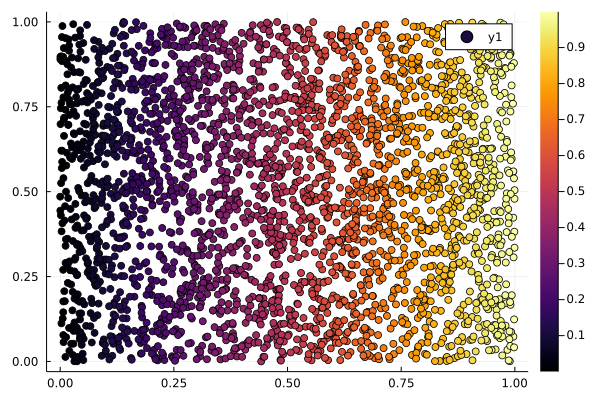

In [345]:
X_SR, _, params = SwissRoll(3000)

scatter(params[:, 1], params[:, 2], zcolor=params[:, 1])
# params

  4.375593 seconds (613.18 k allocations: 297.582 MiB, 8.48% compilation time)


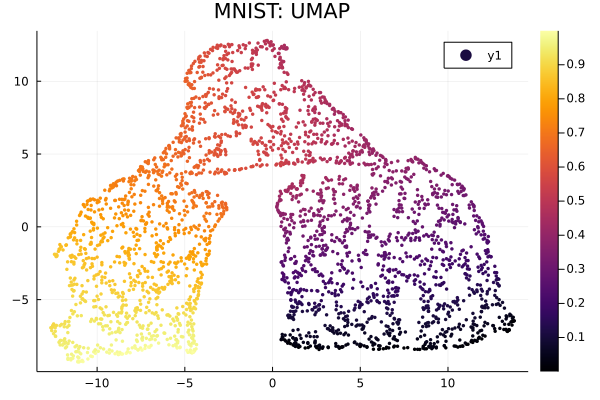

In [346]:

@time res_jl = umap(X_SR'; n_neighbors=15, min_dist=0.5, n_epochs=200)

scatter(res_jl[1,:], res_jl[2,:], zcolor=params[:, 1], 
        title="MNIST: UMAP", marker=(2, 2, :auto, stroke(0)))

  9.135859 seconds (526.74 k allocations: 13.830 GiB, 5.23% gc time, 2.60% compilation time)


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 3.76220610220912e-10, err2 = 3.76220610220912e-10 
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/Cj9SU/src/OptimalTransport.jl:625


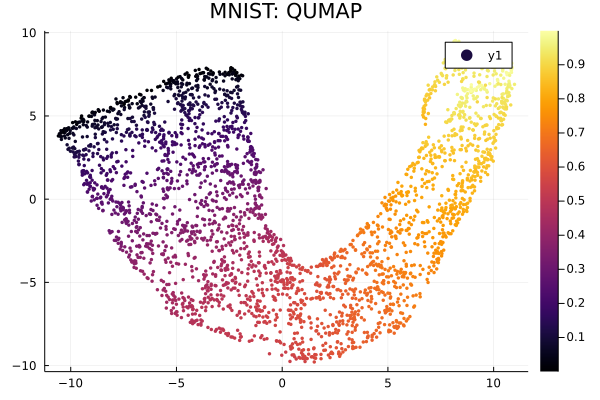

In [347]:
C = pairwise(SqEuclidean(), X_SR', X_SR')
@time qumap = QUMAP_(X_SR', ε = 0.7*mean(C), n_neighbors = 15, min_dist=0.5, n_epochs=200)

q_emb = qumap.embedding
# println(qumap.graph)

scatter(q_emb[1,:], q_emb[2,:], zcolor=params[:, 1], 
        title="MNIST: QUMAP", marker=(2, 2, :auto, stroke(0)))

In [348]:
# download("https://raw.githubusercontent.com/florentPoux/3D-small-datasets/main/tree_sample.csv","point_cloud_sample.csv")
# download("https://raw.githubusercontent.com/florentPoux/3D-small-datasets/main/hippo_1k.obj","hippo_1k.obj")

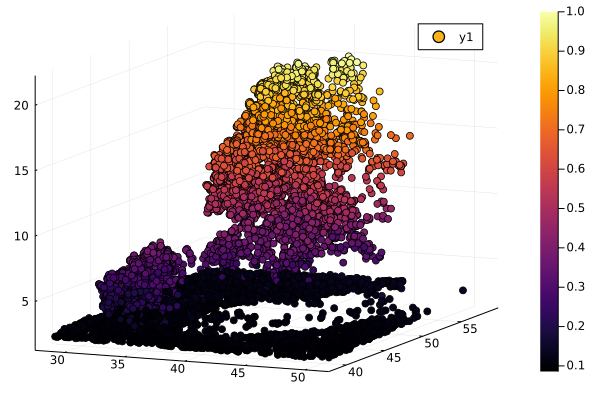

In [349]:
pointlist=readdlm("point_cloud_sample.csv",';')

points  = pointlist[:,1:3]
points_sampled=points[1:10:end,:]
zcoloring_scale=points_sampled[:,3]/maximum(points_sampled[:,3])

# points_sampled
scatter3d(points_sampled[:, 1], points_sampled[:, 2], points_sampled[:, 3], zcolor=zcoloring_scale)

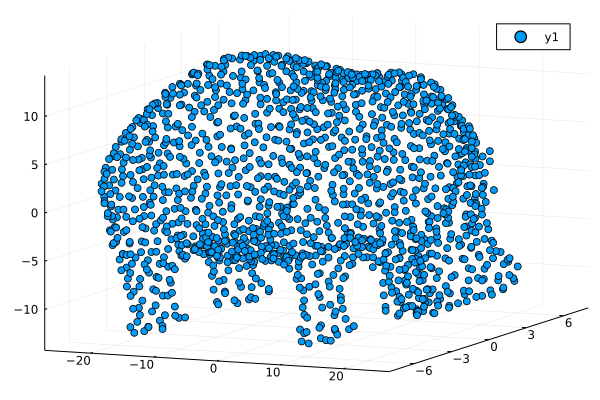

In [350]:

using FileIO 
obj = load("hippo_1k.obj")

hippo = Array.(obj.position)
hippo = Float64.(hcat(hippo...)')

scatter3d(hippo[:,1], hippo[:,2], hippo[:,3])

In [351]:
# download("https://raw.githubusercontent.com/alecjacobson/common-3d-test-models/master/data/horse.obj", "horse.obj")
horse = load("horse.obj")
horse = Array.(horse.position)
horse = Float64.(hcat(horse...)')


48485×3 Matrix{Float64}:
 -0.002022    -0.0401785  -0.000863
  0.000403    -0.0620185  -0.005498
 -0.002863    -0.0600555  -0.009567
 -0.001945    -0.0412555  -0.001349
 -0.001867    -0.0423475  -0.0019
  0.002323    -0.0617885  -0.003647
 -0.002731    -0.0602255  -0.010154
 -0.002201    -0.0608705  -0.010271
  0.001154    -0.0644485  -0.007683
  0.002153    -0.0642025  -0.00525
  0.026003     0.0173305  -0.049434
  0.031932     0.0152075  -0.048681
  0.031883     0.0158365  -0.04869
  ⋮                       
 -0.001022    -0.0444465  -0.002732
 -0.000938    -0.0455605  -0.00346
 -0.000864    -0.0466325  -0.003898
 -0.000791    -0.0476935  -0.004259
 -0.000717    -0.0487655  -0.0047
 -0.000644    -0.0498335  -0.005091
 -0.000566    -0.0509105  -0.005564
 -0.000492    -0.0519875  -0.006036
 -0.000473    -0.0605105  -0.015761
  9.59998e-5  -0.0591295  -0.013502
  0.000209    -0.0603905  -0.015222
 -0.006723    -0.0435065  -0.000967

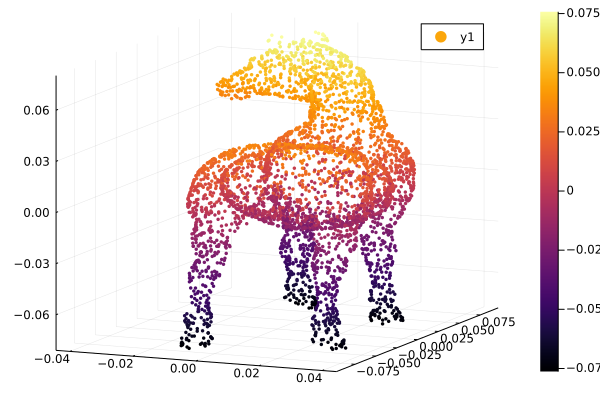

In [365]:

N = 4000
inds = sample(1:size(horse, 1), N, replace = false)

horse = horse[inds, :]
scatter3d(horse[:,1], horse[:,2], horse[:,3], zcolor = horse[:, 3], marker=(2, 2, :auto, stroke(0)))

  5.564163 seconds (383.49 k allocations: 474.823 MiB, 0.87% gc time)


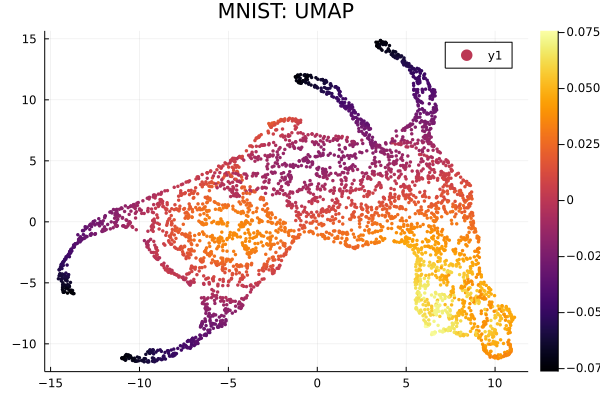

In [353]:

@time res_jl = umap(horse'; n_neighbors=15, min_dist=0.4, n_epochs=200)

scatter(res_jl[1,:], res_jl[2,:], zcolor=horse[:, 3], 
        title="MNIST: UMAP", marker=(2, 2, :auto, stroke(0)))

 10.868074 seconds (44.96 k allocations: 15.493 GiB, 10.09% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.477521797889409e-7, err2 = 8.477521800109855e-7 
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/Cj9SU/src/OptimalTransport.jl:625


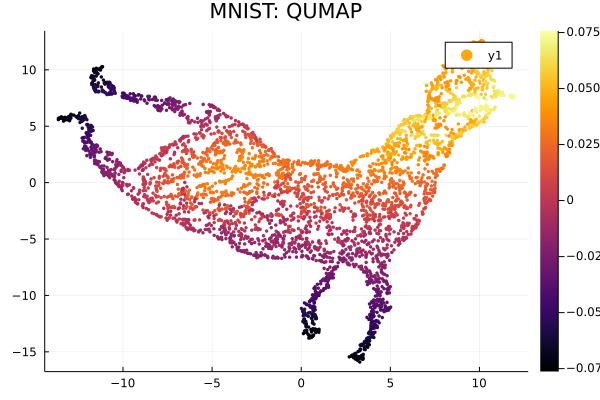

In [370]:
C = pairwise(SqEuclidean(), horse', horse')
@time qumap = QUMAP_(horse'; ε = 0.03*mean(C), n_neighbors = 15, min_dist=0.4, n_epochs=200)

q_emb = qumap.embedding
# println(qumap.graph)

scatter(q_emb[1,:], q_emb[2,:], zcolor=horse[:, 3], 
        title="MNIST: QUMAP", marker=(2, 2, :auto, stroke(0)))

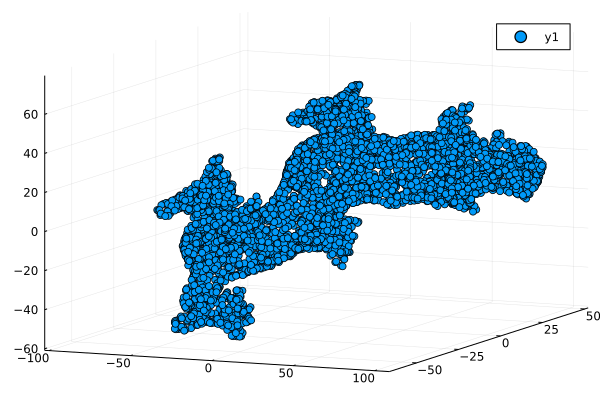

In [355]:
# download("https://raw.githubusercontent.com/alecjacobson/common-3d-test-models/master/data/xyzrgb_dragon.obj", "dragon.obj")
dragon = load("dragon.obj")

dragon = Array.(dragon.position)
dragon = Float64.(hcat(dragon...)')

N = 5000
inds = sample(1:size(dragon, 1), N, replace = false)

dragon = dragon[inds, :]
scatter3d(dragon[:,1], dragon[:,2], dragon[:,3])

  6.572503 seconds (531.21 k allocations: 153.384 MiB)


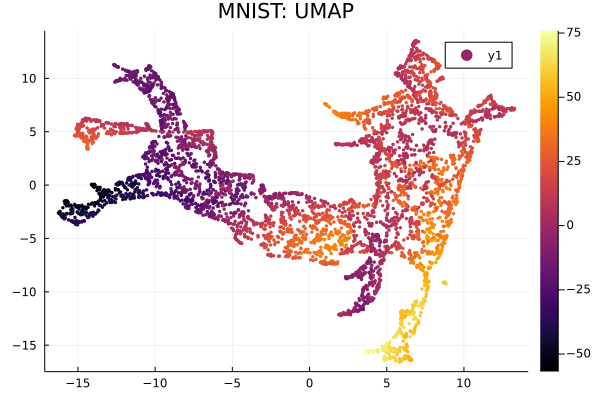

In [356]:

@time res_jl = umap(dragon'; n_neighbors=15, min_dist=0.4, n_epochs=200)

scatter(res_jl[1,:], res_jl[2,:], zcolor=dragon[:, 3], 
        title="MNIST: UMAP", marker=(2, 2, :auto, stroke(0)))

 31.637145 seconds (238.40 k allocations: 41.990 GiB, 7.46% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.818274544320488e-6, err2 = 3.818274544320488e-6 
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/Cj9SU/src/OptimalTransport.jl:625


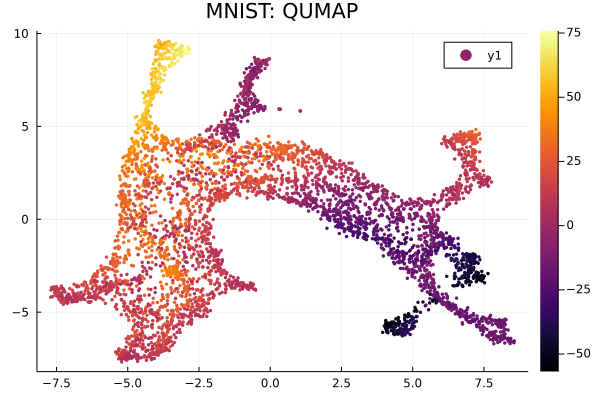

In [357]:
C = pairwise(SqEuclidean(), dragon', dragon')
@time qumap = QUMAP_(dragon'; ε = 0.8*mean(C), n_neighbors = 15, min_dist=0.4, n_epochs=200)

q_emb = qumap.embedding
# println(qumap.graph)

scatter(q_emb[1,:], q_emb[2,:], zcolor=dragon[:, 3], 
        title="MNIST: QUMAP", marker=(2, 2, :auto, stroke(0)))